In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.datasets import VOCSegmentation
from torchvision.transforms.functional import resize, to_tensor
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

import torch.nn.functional as F

import torch
import torch.nn as nn

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(
            self, in_channels=3, out_channels=1, features=[64, 128, 256, 512],
    ):
        super(UNET, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Downsampling
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        # Upsampling
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]

            if x.shape != skip_connection.shape:
                x = TF.resize(x, size=skip_connection.shape[2:])

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)



# Custom dataset class for VOC2012
class VOCSegmentationDataset(Dataset):
    def __init__(self, transform=None, target_transform=None, resize_shape=(256, 256), train=True):
        if train:
            self.voc_dataset = VOCSegmentation(root='./data', year='2012', image_set='train', download=False)
        else:
            self.voc_dataset = VOCSegmentation(root='./data', year='2012', image_set='val', download=False)
        self.transform = transform
        self.target_transform = target_transform
        self.resize_shape = resize_shape

    def __len__(self):
        return len(self.voc_dataset)

    def __getitem__(self, idx):
        image, target = self.voc_dataset[idx]
        image = resize(image, self.resize_shape)
        target = resize(target, self.resize_shape)

        # Convert target mask to binary
        target = np.array(target)
        target = np.where(target > 0, 1.0, 0.0)
        # Convert original image to grayscale
        # image_gray = transforms.Grayscale()(image)
        
        if self.transform:
            image_gray = self.transform(image)
        if self.target_transform:
            target = self.target_transform(target)
        return image_gray, target

# Define transformations
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create dataset and dataloaders
train_dataset = VOCSegmentationDataset(transform=transform, target_transform=transform, train=True)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
test_dataset = VOCSegmentationDataset(transform=transform, target_transform=transform, train=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Initialize U-Net model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNET(in_channels=3, out_channels=1).to(device)  # Binary segmentation has 1 output channel

In [16]:


# Define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()  # Binary Cross Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Training loop
num_epochs = 8
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, targets in tqdm(train_loader):
        images, targets = images.to(device), targets.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        # loss = criterion(outputs, targets.squeeze(1).long())  # Cast targets to LongTensor
        loss = criterion(outputs, targets)  # BCEWithLogitsLoss expects targets to be in [0, 1]
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

# Save the trained model
torch.save(model.state_dict(), 'unet_f2.pth')

100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:10<00:00,  1.04s/it]


Epoch [1/8], Loss: 0.5971


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:08<00:00,  1.03s/it]


Epoch [2/8], Loss: 0.5271


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:08<00:00,  1.03s/it]


Epoch [3/8], Loss: 0.5000


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:08<00:00,  1.03s/it]


Epoch [4/8], Loss: 0.4862


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:08<00:00,  1.03s/it]


Epoch [5/8], Loss: 0.4703


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:08<00:00,  1.03s/it]


Epoch [6/8], Loss: 0.4552


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:10<00:00,  1.04s/it]


Epoch [7/8], Loss: 0.4505


100%|████████████████████████████████████████████████████████████████████████████████| 183/183 [03:10<00:00,  1.04s/it]

Epoch [8/8], Loss: 0.4402


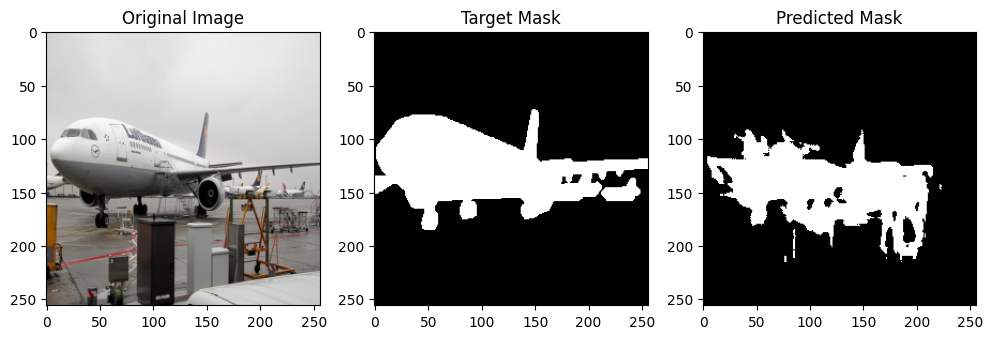

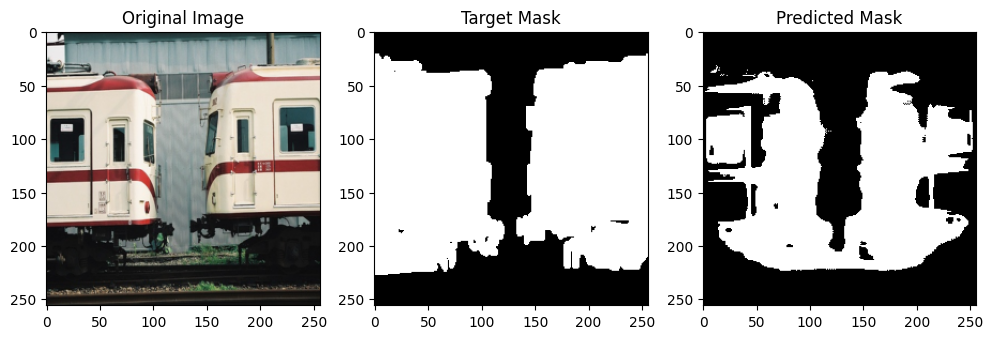

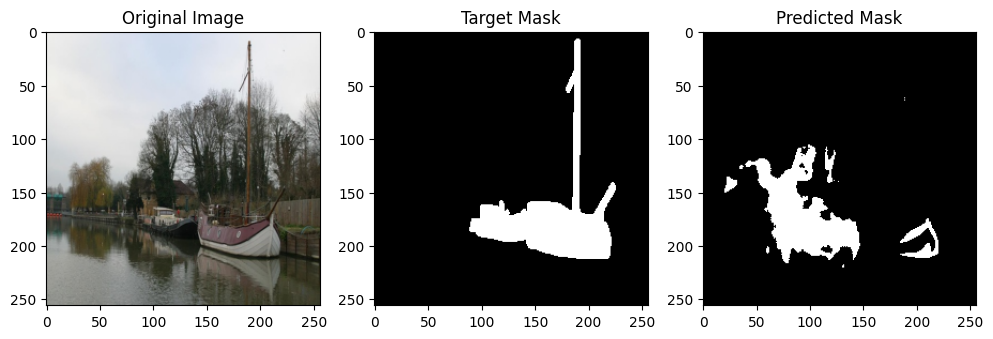

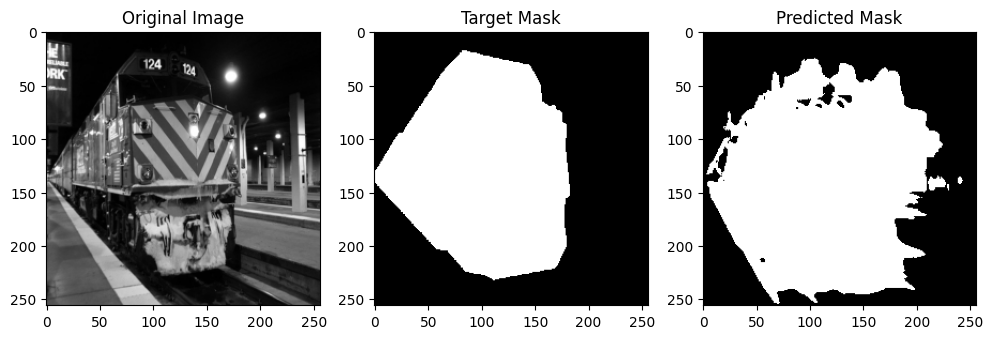

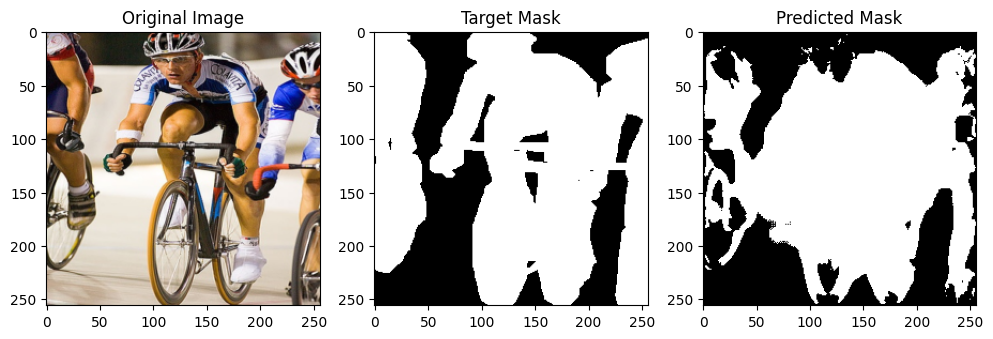

...

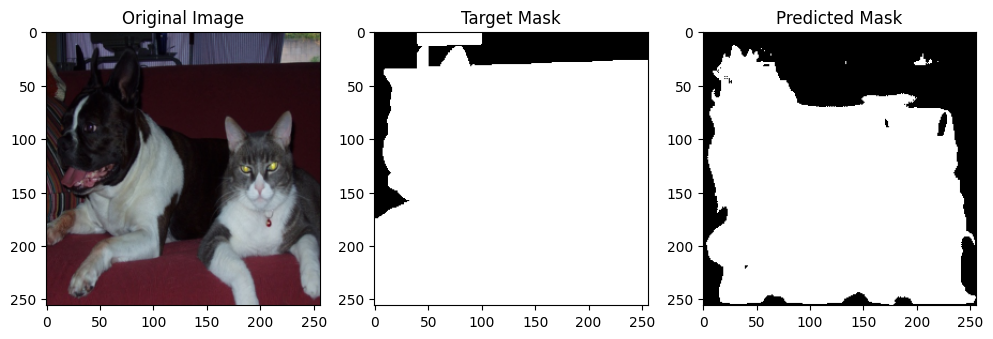

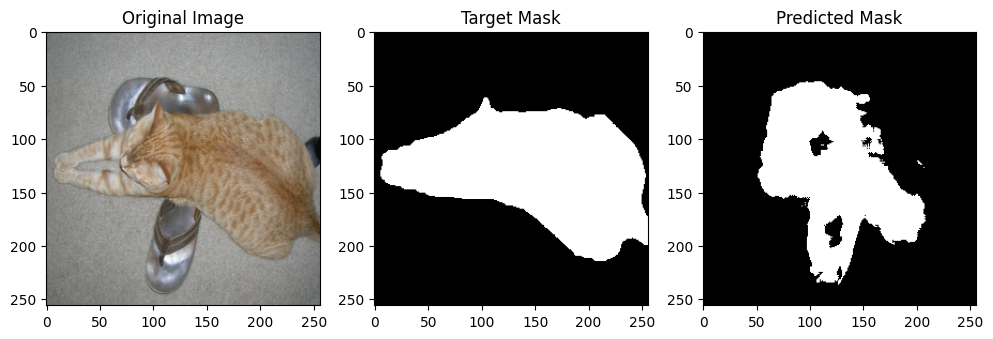

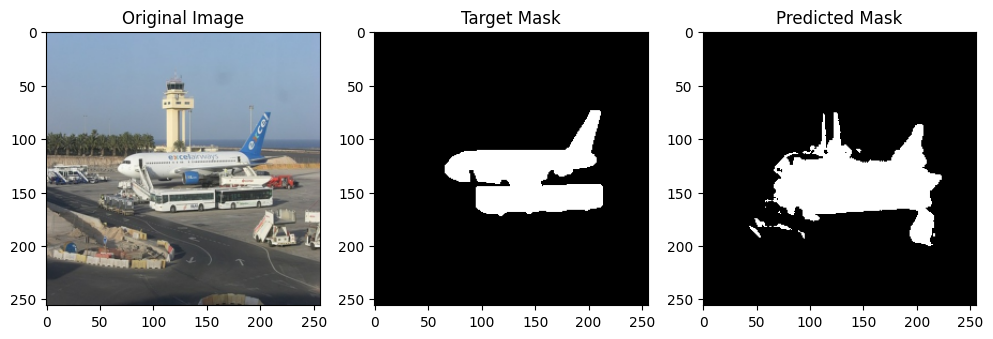

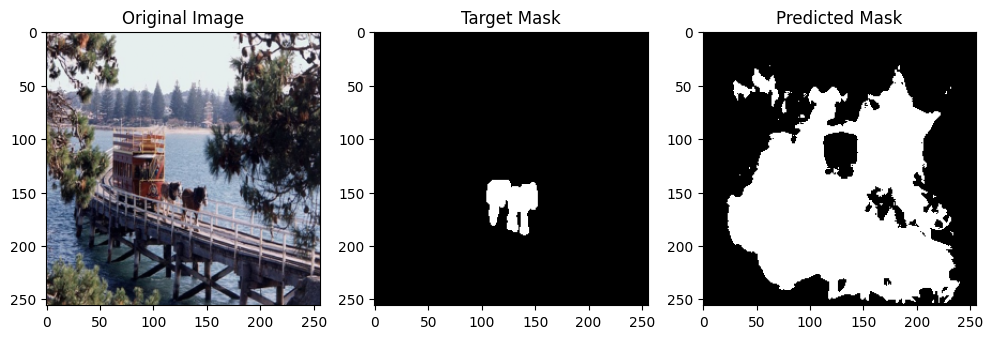

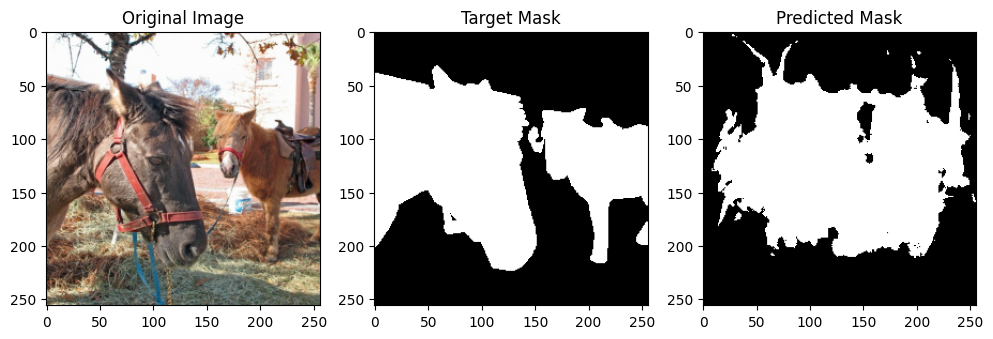

In [17]:
# Initialize the model architecture
model = UNET(in_channels=3, out_channels=1).to(device)

# Load the trained parameters
model.load_state_dict(torch.load('unet_f2.pth'))


# Evaluation and prediction
model.eval()

# Iterate through test loader
with torch.no_grad():
    for i, (images, targets) in enumerate(test_loader):
        if i == 8:  # Stop after first batch
            break
        images, targets = images.to(device), targets.to(device)
        
        # Predict output
        outputs = model(images)
        predicted = F.sigmoid(outputs)  # Apply sigmoid to convert logits to probabilities
        predicted = (predicted > 0.5).float()  # Threshold probabilities to get binary predictions
        
        # Convert tensors to numpy arrays
        images = images.cpu().numpy()
        targets = targets.cpu().numpy()
        predicted = predicted.cpu().numpy()
        
        # Plot the images, target, and predicted output for each sample in the batch
        for j in range(len(images)):
            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            
            # Original Image
            axes[0].imshow(np.transpose(images[j], (1, 2, 0)))
            axes[0].set_title('Original Image')
            
            # Target Mask
            axes[1].imshow(targets[j][0], cmap='gray', vmin=0, vmax=1)
            axes[1].set_title('Target Mask')

            # Predicted Mask
            axes[2].imshow(predicted[j][0], cmap='gray', vmin=0, vmax=1)
            axes[2].set_title('Predicted Mask')
            
            plt.show()

In [18]:
def dice_score(y_true, y_pred, smooth=1e-6):
    intersection = torch.sum(y_true * y_pred)
    union = torch.sum(y_true) + torch.sum(y_pred)
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.item()

# Example usage:
dice_scores = []
with torch.no_grad():
    for images, targets in test_loader:
        images, targets = images.to(device), targets.to(device)
        outputs = model(images)
        predicted = torch.sigmoid(outputs) > 0.5
        dice = dice_score(targets, predicted)
        dice_scores.append(dice)

mean_dice_score = sum(dice_scores) / len(dice_scores)
print(f"Mean Dice Score: {mean_dice_score:.4f}")

Mean Dice Score: 0.6521


In [19]:
def accuracy(y_true, y_pred):
    # Flatten the tensors
    y_true = y_true.view(-1)
    y_pred = y_pred.view(-1)

    # Compute accuracy
    correct = torch.sum((y_true == y_pred).float())
    total = y_true.numel()

    return correct / total

# Example usage:
accuracies = []
with torch.no_grad():
    for images, targets in test_loader:
        images, targets = images.to(device), targets.to(device)
        outputs = model(images)
        predicted = torch.sigmoid(outputs) > 0.5
        acc = accuracy(targets, predicted)
        accuracies.append(acc)

mean_accuracy = sum(accuracies) / len(accuracies)
print(f"Mean Accuracy: {mean_accuracy:.4f}")


Mean Accuracy: 0.7932


In [20]:
def iou(y_true, y_pred):
    intersection = torch.sum(y_true * y_pred)
    union = torch.sum(y_true) + torch.sum(y_pred) - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()

# Example usage:
iou_scores = []
with torch.no_grad():
    for images, targets in test_loader:
        images, targets = images.to(device), targets.to(device)
        outputs = model(images)
        predicted = torch.sigmoid(outputs) > 0.5
        
        iou_score = iou(targets, predicted)
        iou_scores.append(iou_score)

mean_iou_score = sum(iou_scores) / len(iou_scores)
print(f"Mean IoU Score: {mean_iou_score:.4f}")

Mean IoU Score: 0.4886
